##### Importing the necessary libraries

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.graphics.tsaplots import plot_pacf
import statsmodels.api as sm

sns.set_style('darkgrid')
%matplotlib inline

##### Importing the Dataset

In [3]:
train_df = pd.read_csv('train_IxoE5JN.csv')
test_df = pd.read_csv('test_WudNWDM.csv')

##### Data Pre-Processing & EDA

In [4]:
train_df['datetime'] = pd.to_datetime(train_df['datetime'])
train_df = train_df.rename(columns = {'DATE':'datetime'})
train_df = train_df.set_index('datetime')
train_df

,row_id,energy
datetime,,
2008-03-01 00:00:00,1,1259.985563
2008-03-01 01:00:00,2,1095.541500
2008-03-01 02:00:00,3,1056.247500
2008-03-01 03:00:00,4,1034.742000
2008-03-01 04:00:00,5,1026.334500
...,...,...
2018-12-31 19:00:00,94988,2528.446800
2018-12-31 20:00:00,94989,2461.883600
2018-12-31 21:00:00,94990,2365.994400


In [5]:
train_df = train_df.drop(['row_id'],axis=1)

In [6]:
train_df.head()

,energy
datetime,
2008-03-01 00:00:00,1259.985563
2008-03-01 01:00:00,1095.541500
2008-03-01 02:00:00,1056.247500
2008-03-01 03:00:00,1034.742000
2008-03-01 04:00:00,1026.334500


In [7]:
train_df.describe()

,energy
count,93092.000000
mean,1702.995014
std,369.322103
min,866.388600
25%,1431.541100
50%,1654.465800
75%,1935.993450
max,3374.399600


In [8]:
train_df.isna().sum()

energy    1900
dtype: int64

In [9]:
def describe_data(df):
    print("Data Types:")
    print(df.dtypes)
    print("Rows and Columns:")
    print(df.shape)
    print("Column Names:")
    print(df.columns)
    print("Null Values:")
    print(df.apply(lambda x: sum(x.isnull()) / len(df)))
describe_data(train_df)

Data Types:
energy    float64
dtype: object
Rows and Columns:
(94992, 1)
Column Names:
Index(['energy'], dtype='object')
Null Values:
energy    0.020002
dtype: float64


In [10]:
train_df.isnull().sum()

energy    1900
dtype: int64

In [11]:
train_df['energy'].fillna(int(train_df['energy'].mean()), inplace=True)

In [12]:
numeric_features = train_df.select_dtypes(include=['int64', 'float64']).columns

In [13]:
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
numeric_transformer = Pipeline(steps=[
    ('imputer', SimpleImputer(strategy='median')),
    ('scaler', StandardScaler())])

In [14]:
from sklearn.compose import ColumnTransformer
preprocessor = ColumnTransformer(
    transformers=[
        ('num', numeric_transformer, numeric_features)])

In [15]:
train_df.describe(include='all')

,energy
count,94992.000000
mean,1702.975112
std,365.609902
min,866.388600
25%,1436.432500
50%,1664.625600
75%,1930.196675
max,3374.399600


In [16]:
train_df[train_df.isnull().any(axis=1)]

,energy
datetime,


In [17]:
train_df.corr()

,energy
energy,1.0


In [18]:
corr = train_df.corr(method='pearson')
print("Correlation of the Dataset:",corr)

Correlation of the Dataset:         energy
energy     1.0


#### Exploratory Data Analysis

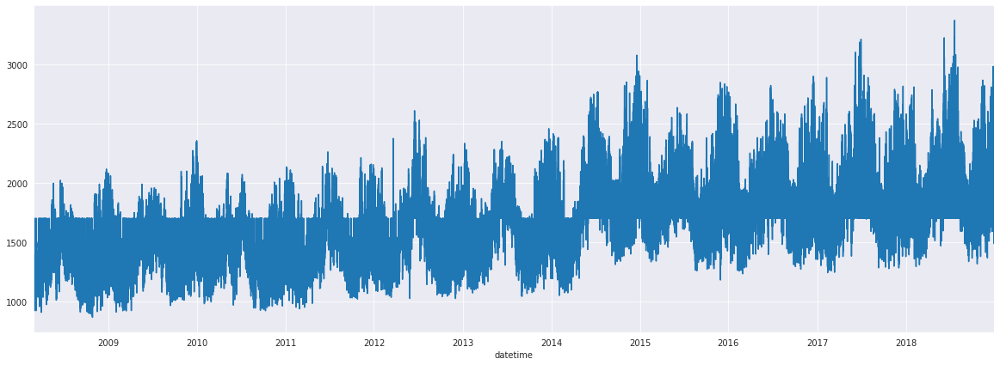

In [19]:
plt.figure(figsize = (20,7))
train_df['energy'].plot(kind = 'line')
plt.show()

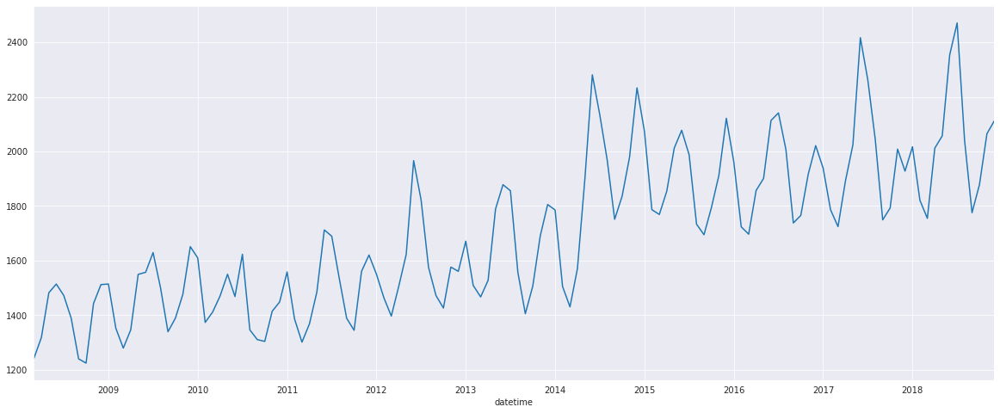

In [20]:
plt.figure(figsize = (20,8))
train_df['2008':'2018'].resample('m').mean()['energy'].plot(kind = 'line')
plt.show()

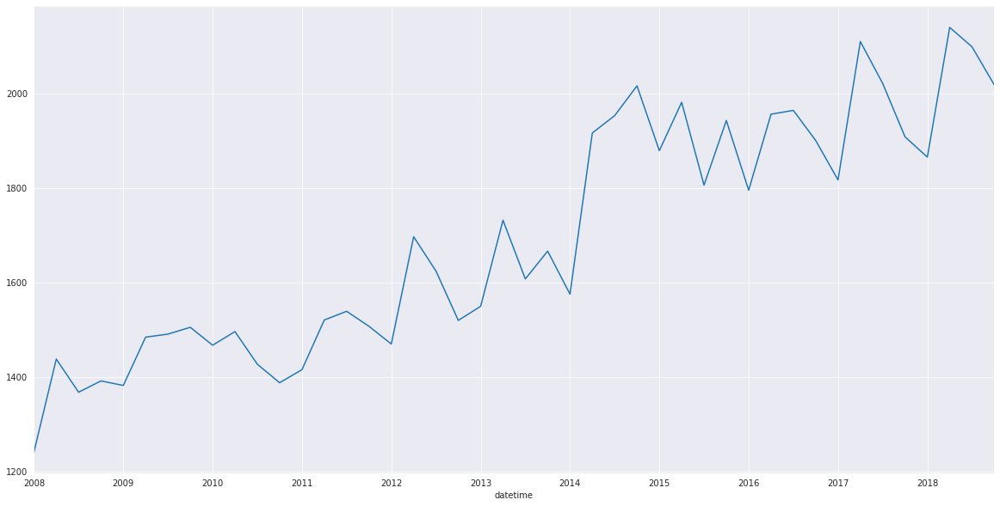

In [21]:
plt.figure(figsize = (20,10))
train_df['2008':'2018'].resample('q').mean()['energy'].plot(kind = 'line')
plt.show()

In [22]:
from statsmodels.tsa.stattools import adfuller,kpss
adftest = adfuller(train_df['energy'])
adftest

(-9.77974666962966,
 6.783205657417085e-17,
 67,
 94924,
 {'1%': -3.4304188917117377,
  '5%': -2.8615704490393217,
  '10%': -2.5667862069612752},
 1079838.321200942)

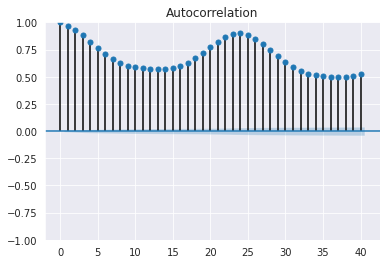

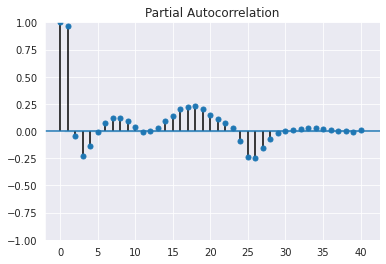

In [23]:
acf = plot_acf(train_df,lags=40)
pacf = plot_pacf(train_df,lags=40, method='ols')

In [24]:
temp = pd.DataFrame(np.log(train_df['energy']))

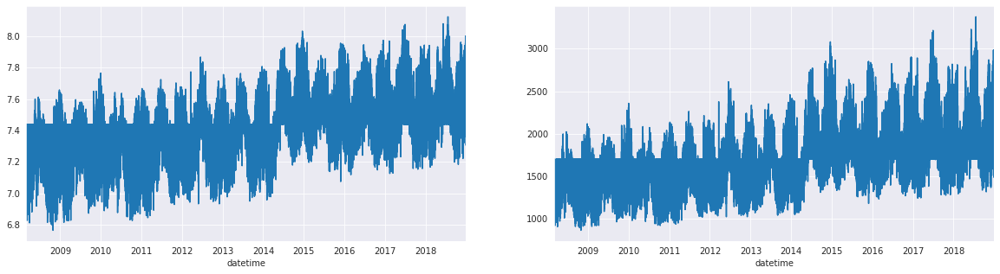

In [25]:
plt.figure(figsize = (20,5))
plt.subplot(1,2,1)
temp['energy'].plot(kind = 'line')
plt.subplot(1,2,2)
train_df['energy'].plot(kind = 'line')
plt.show()

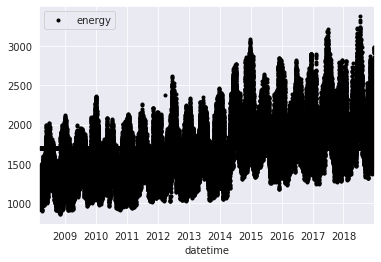

In [78]:
train_df.plot(style='k.')
plt.show()

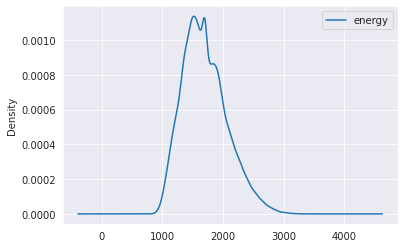

In [79]:
train_df.plot(kind='kde')

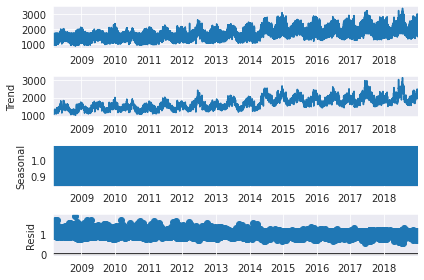

In [80]:
from statsmodels.tsa.seasonal import seasonal_decompose
result = seasonal_decompose(train_df, model='multiplicative')
result.plot()
plt.show()

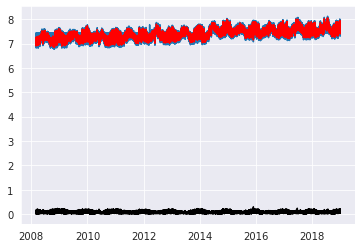

In [81]:
df_log = np.log(train_df)
moving_avg = df_log.rolling(12).mean()
std_dev = df_log.rolling(12).std()
plt.plot(df_log)
plt.plot(moving_avg, color="red")
plt.plot(std_dev, color ="black")
plt.show()

In [82]:
df_log_moving_avg_diff = df_log-moving_avg
df_log_moving_avg_diff.dropna(inplace=True)

In [85]:
weighted_average = df_log.ewm(halflife=12, min_periods=0,adjust=True).mean()

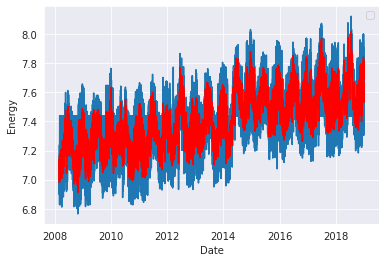

In [86]:
plt.plot(df_log)
plt.plot(weighted_average, color='red')
plt.xlabel("Date")
plt.ylabel("Energy")
from pylab import rcParams
rcParams['figure.figsize'] = 10,6
plt.legend()
plt.show(block =False)

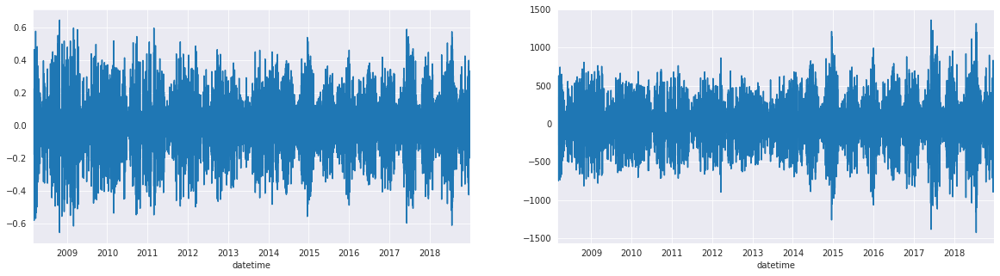

In [26]:
plt.figure(figsize = (20,5))
plt.subplot(1,2,1)
temp['energy'].diff(1).dropna().plot()
plt.subplot(1,2,2)
train_df['energy'].diff(1).dropna().plot()
plt.show()

In [27]:
kptest = kpss(temp['energy'].diff(1).dropna(),'c')
kptest

/usr/local/lib/python3.7/dist-packages/statsmodels/tsa/stattools.py:2023: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is greater than the p-value returned.

  warn_msg.format(direction="greater"), InterpolationWarning


(0.011969745050164385,
 0.1,
 2088,
 {'10%': 0.347, '5%': 0.463, '2.5%': 0.574, '1%': 0.739})

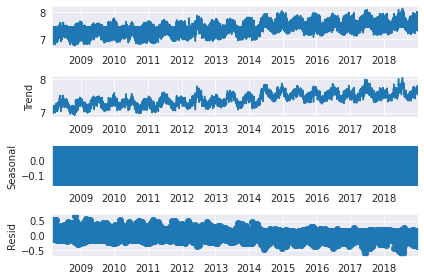

In [28]:
add_plot = sm.tsa.seasonal_decompose(temp,model = 'additive')
add_plot = add_plot.plot()

In [29]:
!pip install -q pmdarima

In [30]:
# import pmdarima as pm

# model = pm.auto_arima(train_df, seasonal = True, d = 1, D = 1,m = 4,test='adf',error_action='ignore',  
#                            suppress_warnings=True,
#                       stepwise=True, trace=True)

In [31]:
# model.summary()

In [32]:
# output = model.plot_diagnostics()

Model Building & Model Training

In [36]:
import pmdarima as pm

model = pm.auto_arima(train_df,test='adf',error_action='ignore',  
                           suppress_warnings=True,
                      stepwise=True, trace=True)

Performing stepwise search to minimize aic
 ARIMA(2,0,2)(0,0,0)[0] intercept   : AIC=1126127.539, Time=89.21 sec
 ARIMA(0,0,0)(0,0,0)[0] intercept   : AIC=1390781.909, Time=1.97 sec
 ARIMA(1,0,0)(0,0,0)[0] intercept   : AIC=1133726.270, Time=5.63 sec
 ARIMA(0,0,1)(0,0,0)[0] intercept   : AIC=1293705.135, Time=21.79 sec
 ARIMA(0,0,0)(0,0,0)[0]             : AIC=1687364.029, Time=0.94 sec
 ARIMA(1,0,2)(0,0,0)[0] intercept   : AIC=1129282.839, Time=61.79 sec
 ARIMA(2,0,1)(0,0,0)[0] intercept   : AIC=1133625.882, Time=87.72 sec
 ARIMA(3,0,2)(0,0,0)[0] intercept   : AIC=1119858.577, Time=120.84 sec
 ARIMA(3,0,1)(0,0,0)[0] intercept   : AIC=1127373.180, Time=104.16 sec
 ARIMA(4,0,2)(0,0,0)[0] intercept   : AIC=1118792.168, Time=154.25 sec
 ARIMA(4,0,1)(0,0,0)[0] intercept   : AIC=1126795.415, Time=42.96 sec
 ARIMA(5,0,2)(0,0,0)[0] intercept   : AIC=1125198.049, Time=176.65 sec
 ARIMA(4,0,3)(0,0,0)[0] intercept   : AIC=1120726.386, Time=160.27 sec
 ARIMA(3,0,3)(0,0,0)[0] intercept   : AIC=112

In [37]:
import pmdarima as pm
from pmdarima.model_selection import train_test_split
train,test = train_test_split(train_df,test_size = 0.1)

In [39]:
prediction = pd.DataFrame(model.predict(n_periods = int(test.size)), test.index)
prediction.columns = ["Prediction"]
test["Prediction"] = prediction

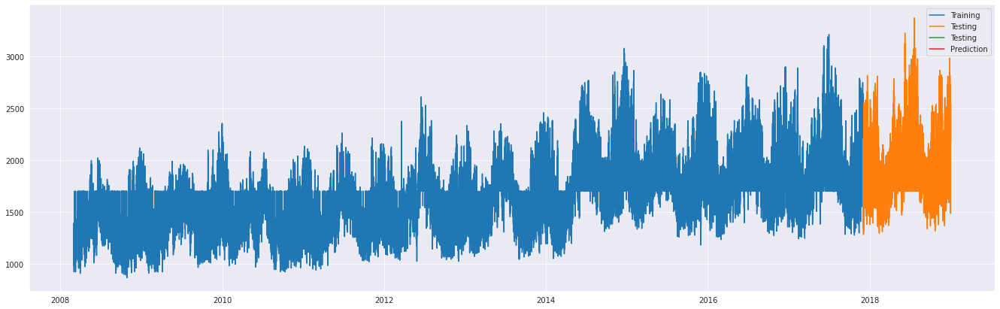

In [40]:
plt.figure(figsize = (23,7))
plt.plot(train, label = "Training")
plt.plot(test, label = "Testing")
plt.plot(prediction, label = "Prediction")
plt.legend()

In [42]:
from pandas.tseries.offsets import DateOffset
future_dates = [train_df.index[-1] + DateOffset(months = x) for x in range(0,24)]

In [44]:
future_date_df = pd.DataFrame(index = future_dates[1:],columns = train_df.columns)
future_date_df["forecast"] = model.predict(n_periods = int(future_date_df.size),dynamic  = True )

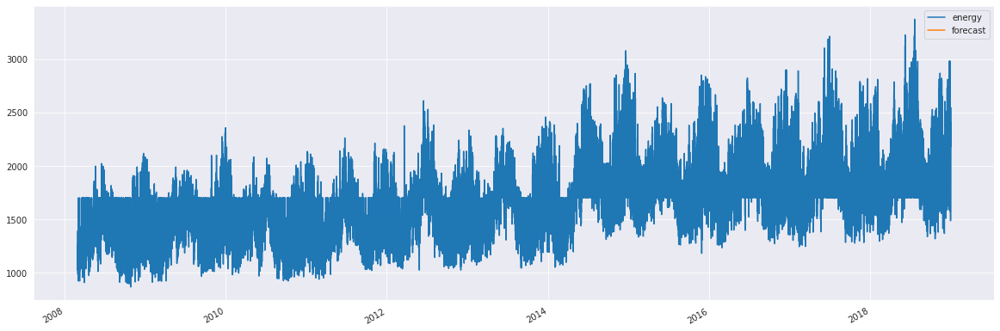

In [46]:
future_df = pd.concat([train_df,future_date_df])
future_df.plot(figsize = (20,7))

In [51]:
# !pip install -q prophet

In [63]:
# !pip install pystan==2.19.1.1
# !sudo pip install fbprophet==0.7.1

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 67.3 MB 139 kB/s 
  Attempting uninstall: pystan
    Found existing installation: pystan 3.3.0
    Uninstalling pystan-3.3.0:
      Successfully uninstalled pystan-3.3.0
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Using cached fbprophet-0.7.1.tar.gz (64 kB)
  Created wheel for fbprophet: filename=fbprophet-0.7.1-py3-none-any.whl size=6638620 sha256=73faed5b1ec08d161b323bb84a8a26fbddd9aead790f47936c21f457545f3c62
  Stored in directory: /root/.cache/pip/wheels/cd/a1/12/db63ff624de492fe6cccf676091a0860fdde2ffde4bc3280e2
Successfully built fbprophet


In [67]:
from prophet.plot import plot_plotly
from fbprophet import Prophet

In [70]:
fb_data = train_df.reset_index().rename(columns = {'datetime':'ds', 'energy':'y'})
train,test = train_test_split(fb_data,test_size = 0.1)

In [72]:
m = Prophet()
m.fit(fb_data)

In [73]:
future = m.make_future_dataframe(periods= int(test.shape[0]), freq = 'H')
forecast = m.predict(future)

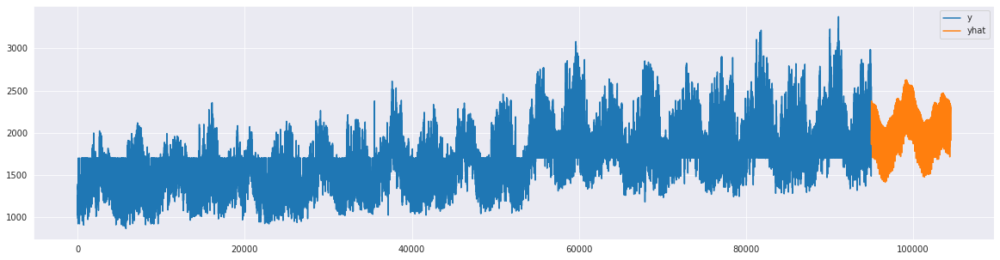

In [74]:
fb_data['y'].plot(kind = 'line')
forecast[int(forecast.shape[0])- int(test.shape[0]):]['yhat'].plot(kind = 'line', figsize = (20,5))
plt.legend()
plt.show()

In [75]:
plot_plotly(m ,forecast)

# Finalizing the Model

In [76]:
m_all = Prophet(interval_width=0.95)
m_all.fit(fb_data)
future = m_all.make_future_dataframe(periods= 24, freq = 'H')
forecast = m_all.predict(future)

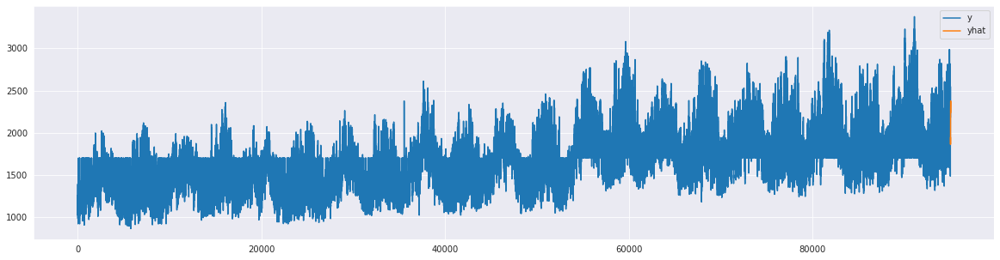

In [77]:
fb_data['y'].plot(kind = 'line')
forecast[-(int(forecast.shape[0])-int(fb_data.shape[0]))+1:]['yhat'].plot(kind = 'line', figsize = (20,5))
plt.legend()
plt.show()

## Performing Cross-Validation

In [110]:
from fbprophet.diagnostics import cross_validation
df_cv = cross_validation(m, initial='2000 days', period='180 days', horizon = '365 days')
df_cv.head()

INFO:fbprophet:Making 9 forecasts with cutoffs between 2014-01-21 23:00:00 and 2017-12-31 23:00:00


  0%|          | 0/9 [00:00<?, ?it/s]

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2014-01-22 00:00:00,1775.472206,1574.385919,1960.731388,1572.3372,2014-01-21 23:00:00
1,2014-01-22 01:00:00,1700.949922,1521.951759,1897.368220,1453.6116,2014-01-21 23:00:00
2,2014-01-22 02:00:00,1643.260182,1455.512219,1827.726186,1384.5104,2014-01-21 23:00:00
3,2014-01-22 03:00:00,1608.931119,1424.775357,1787.681959,1352.4980,2014-01-21 23:00:00
4,2014-01-22 04:00:00,1603.237387,1411.607113,1786.661808,1320.4856,2014-01-21 23:00:00


In [113]:
df_cv.tail()

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
78835,2018-12-31 19:00:00,2172.514502,1679.859737,2656.737836,2528.4468,2017-12-31 23:00:00
78836,2018-12-31 20:00:00,2193.213923,1706.833877,2655.468158,2461.8836,2017-12-31 23:00:00
78837,2018-12-31 21:00:00,2187.101636,1728.887160,2633.633578,2365.9944,2017-12-31 23:00:00
78838,2018-12-31 22:00:00,2145.785645,1647.227992,2605.336163,2342.9428,2017-12-31 23:00:00
78839,2018-12-31 23:00:00,2076.320718,1594.619049,2515.200807,2180.2176,2017-12-31 23:00:00


In [131]:
df_cv

,ds,yhat,yhat_lower,yhat_upper,y,cutoff
0,2014-01-22 00:00:00,1775.472206,1574.385919,1960.731388,1572.3372,2014-01-21 23:00:00
1,2014-01-22 01:00:00,1700.949922,1521.951759,1897.368220,1453.6116,2014-01-21 23:00:00
2,2014-01-22 02:00:00,1643.260182,1455.512219,1827.726186,1384.5104,2014-01-21 23:00:00
3,2014-01-22 03:00:00,1608.931119,1424.775357,1787.681959,1352.4980,2014-01-21 23:00:00
4,2014-01-22 04:00:00,1603.237387,1411.607113,1786.661808,1320.4856,2014-01-21 23:00:00
...,...,...,...,...,...,...
78835,2018-12-31 19:00:00,2172.514502,1679.859737,2656.737836,2528.4468,2017-12-31 23:00:00
78836,2018-12-31 20:00:00,2193.213923,1706.833877,2655.468158,2461.8836,2017-12-31 23:00:00
78837,2018-12-31 21:00:00,2187.101636,1728.887160,2633.633578,2365.9944,2017-12-31 23:00:00
78838,2018-12-31 22:00:00,2145.785645,1647.227992,2605.336163,2342.9428,2017-12-31 23:00:00


In [132]:
# cutoffs = pd.to_datetime(['2019-02-01', '2020-08-01', '2021-02-01'])
# df_cv2 = cross_validation(m, cutoffs=cutoffs, horizon='365 days')

In [133]:
from fbprophet.diagnostics import performance_metrics
df_p = performance_metrics(df_cv)
df_p.head()

,horizon,mse,rmse,mae,mape,mdape,coverage
0,36 days 12:00:00,60236.952296,245.432175,201.042375,0.107173,0.093658,0.562659
1,36 days 13:00:00,60244.852537,245.448269,201.039920,0.107166,0.093673,0.562785
2,36 days 14:00:00,60239.883548,245.438146,201.003579,0.107136,0.093683,0.562912
3,36 days 15:00:00,60221.266690,245.400217,200.932345,0.107082,0.093683,0.563166
4,36 days 16:00:00,60193.054820,245.342729,200.841364,0.107014,0.093557,0.563673


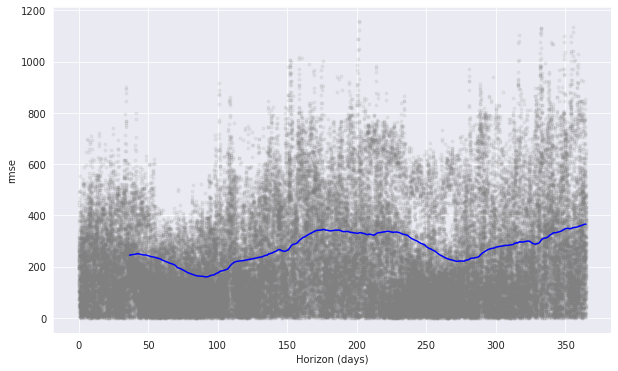

In [134]:
from prophet.plot import plot_cross_validation_metric
fig = plot_cross_validation_metric(df_cv, metric='rmse')


In [135]:
fb_data

,ds,y
0,2008-03-01 00:00:00,1259.985563
1,2008-03-01 01:00:00,1095.541500
2,2008-03-01 02:00:00,1056.247500
3,2008-03-01 03:00:00,1034.742000
4,2008-03-01 04:00:00,1026.334500
...,...,...
94987,2018-12-31 19:00:00,2528.446800
94988,2018-12-31 20:00:00,2461.883600
94989,2018-12-31 21:00:00,2365.994400
94990,2018-12-31 22:00:00,2342.942800


In [141]:
test_prediction = m.predict(pd.DataFrame({'ds':test_df['datetime']}))

In [137]:
test_prediction

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2019-01-01 00:00:00,2058.627549,1802.357131,2235.522299,2058.627549,2058.627549,-38.180921,-38.180921,-38.180921,-77.933491,...,-62.149391,-62.149391,-62.149391,101.901961,101.901961,101.901961,0.0,0.0,0.0,2020.446628
1,2019-01-01 01:00:00,2058.634478,1718.517206,2173.373034,2058.634478,2058.634478,-112.302428,-112.302428,-112.302428,-160.188462,...,-53.794305,-53.794305,-53.794305,101.680339,101.680339,101.680339,0.0,0.0,0.0,1946.332050
2,2019-01-01 02:00:00,2058.641408,1651.619204,2108.465022,2058.641408,2058.641408,-166.906438,-166.906438,-166.906438,-222.934504,...,-45.430726,-45.430726,-45.430726,101.458792,101.458792,101.458792,0.0,0.0,0.0,1891.734970
3,2019-01-01 03:00:00,2058.648338,1646.712682,2115.021646,2058.648338,2058.648338,-194.969108,-194.969108,-194.969108,-259.102190,...,-37.104249,-37.104249,-37.104249,101.237330,101.237330,101.237330,0.0,0.0,0.0,1863.679230
4,2019-01-01 04:00:00,2058.655267,1640.829733,2088.695398,2058.655267,2058.655267,-191.094546,-191.094546,-191.094546,-263.251129,...,-28.859380,-28.859380,-28.859380,101.015962,101.015962,101.015962,0.0,0.0,0.0,1867.560721
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
26299,2021-12-31 19:00:00,2240.866916,-4.968731,5031.017781,-302.802531,4728.818903,301.715547,301.715547,301.715547,142.123390,...,57.911818,57.911818,57.911818,101.680339,101.680339,101.680339,0.0,0.0,0.0,2542.582463
26300,2021-12-31 20:00:00,2240.873846,32.797057,5045.618264,-303.043315,4728.964755,314.042918,314.042918,314.042918,155.424708,...,57.159418,57.159418,57.159418,101.458792,101.458792,101.458792,0.0,0.0,0.0,2554.916763
26301,2021-12-31 21:00:00,2240.880775,1.470381,5054.319633,-303.284098,4729.110607,298.623077,298.623077,298.623077,141.036406,...,56.349340,56.349340,56.349340,101.237330,101.237330,101.237330,0.0,0.0,0.0,2539.503852
26302,2021-12-31 22:00:00,2240.887705,-0.134521,4994.281649,-303.524882,4729.256459,247.134869,247.134869,247.134869,90.642144,...,55.476762,55.476762,55.476762,101.015962,101.015962,101.015962,0.0,0.0,0.0,2488.022574


In [138]:
test_prediction = test_prediction['yhat']
test_prediction = test_prediction.astype(int)
test_df['energy'] = test_prediction
test_df.head()
test_df.to_csv('submission.csv', index=False)

In [139]:
from google.colab import files
files.download('submission.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>